# Visualization

## Read

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
import math
from pandas.plotting import scatter_matrix
from sklearn.decomposition import PCA
from scipy import stats

In [2]:
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
df = pd.read_csv('data/dataset2.csv')

In [4]:
df.head(5)

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,...,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade,genre
0,Jealous Kind Of Fella,Garland Green,spotify:track:1dtKN6wwlolkM8XZy2y9C1,0.417,0.620,3,-7.727,1,0.0403,0.490,...,0.0779,0.845,185.655,173533,3,32.94975,9,1,60,NaN
1,Initials B.B.,Serge Gainsbourg,spotify:track:5hjsmSnUefdUqzsDogisiX,0.498,0.505,3,-12.475,1,0.0337,0.018,...,0.1760,0.797,101.801,213613,4,48.82510,10,0,60,pop
2,Melody Twist,Lord Melody,spotify:track:6uk8tI6pwxxdVTNlNOJeJh,0.657,0.649,5,-13.392,1,0.0380,0.846,...,0.1190,0.908,115.940,223960,4,37.22663,12,0,60,NaN
3,Mi Bomba Sonó,Celia Cruz,spotify:track:7aNjMJ05FvUXACPWZ7yJmv,0.590,0.545,7,-12.058,0,0.1040,0.706,...,0.0610,0.967,105.592,157907,4,24.75484,8,0,60,NaN
4,Uravu Solla,P. Susheela,spotify:track:1rQ0clvgkzWr001POOPJWx,0.515,0.765,11,-3.515,0,0.1240,0.857,...,0.2130,0.906,114.617,245600,4,21.79874,14,0,60,NaN


## Missing values

In [5]:
df.isna().sum()

track                   0
artist                  0
uri                     0
danceability            0
energy                  0
key                     0
loudness                0
mode                    0
speechiness             0
acousticness            0
instrumentalness        0
liveness                0
valence                 0
tempo                   0
duration_ms             0
time_signature          0
chorus_hit              0
sections                0
target                  0
decade                  0
genre               20799
dtype: int64

In [6]:
print('Genres:')
total = len(df['genre'])
available = len(df['genre'].dropna())
missing = total - available
print(f'Total: {total}')
print(f'Available: {available}')
print(f'Missing: {missing}')
print(f'Percentage available: {available / total * 100}%')

Genres:
Total: 41106
Available: 20307
Missing: 20799
Percentage available: 49.40154721938403%


## Descriptive statistics

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41106 entries, 0 to 41105
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             41106 non-null  object 
 1   artist            41106 non-null  object 
 2   uri               41106 non-null  object 
 3   danceability      41106 non-null  float64
 4   energy            41106 non-null  float64
 5   key               41106 non-null  int64  
 6   loudness          41106 non-null  float64
 7   mode              41106 non-null  int64  
 8   speechiness       41106 non-null  float64
 9   acousticness      41106 non-null  float64
 10  instrumentalness  41106 non-null  float64
 11  liveness          41106 non-null  float64
 12  valence           41106 non-null  float64
 13  tempo             41106 non-null  float64
 14  duration_ms       41106 non-null  int64  
 15  time_signature    41106 non-null  int64  
 16  chorus_hit        41106 non-null  float6

In [8]:
df.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade
count,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,4.110600e+04,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000
mean,0.539695,0.579545,5.213594,-10.221525,0.693354,0.072960,0.364197,0.154416,0.201535,0.542440,119.338249,2.348776e+05,3.893689,40.106041,10.475673,0.500000,52.925607
std,0.177821,0.252628,3.534977,5.311626,0.461107,0.086112,0.338913,0.303530,0.172959,0.267329,29.098845,1.189674e+05,0.423073,19.005515,4.871850,0.500006,32.562672
min,0.000000,0.000251,0.000000,-49.253000,0.000000,0.000000,0.000000,0.000000,0.013000,0.000000,0.000000,1.516800e+04,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.420000,0.396000,2.000000,-12.816000,0.000000,0.033700,0.039400,0.000000,0.094000,0.330000,97.397000,1.729278e+05,4.000000,27.599793,8.000000,0.000000,10.000000
50%,0.552000,0.601000,5.000000,-9.257000,1.000000,0.043400,0.258000,0.000120,0.132000,0.558000,117.565000,2.179070e+05,4.000000,35.850795,10.000000,0.500000,60.000000
75%,0.669000,0.787000,8.000000,-6.374250,1.000000,0.069800,0.676000,0.061250,0.261000,0.768000,136.494000,2.667730e+05,4.000000,47.625615,12.000000,1.000000,80.000000
max,0.988000,1.000000,11.000000,3.744000,1.000000,0.960000,0.996000,1.000000,0.999000,0.996000,241.423000,4.170227e+06,5.000000,433.182000,169.000000,1.000000,90.000000


## Song count per year

<AxesSubplot:>

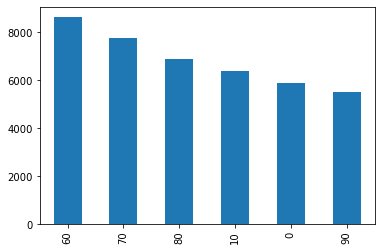

In [9]:
df['decade'].value_counts().plot.bar()

## Genre distribution

In [10]:
df['genre'].value_counts()

pop        7181
rock       5394
country    2117
hip-hop    1568
jazz       1347
funk       1001
metal       941
blues       596
techno      162
Name: genre, dtype: int64

<AxesSubplot:ylabel='genre'>

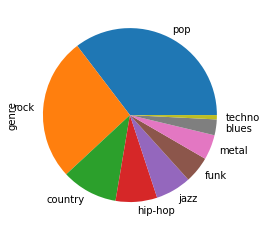

In [11]:
df['genre'].value_counts().plot.pie()

## Pairplots

In [12]:
regression_columns = ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'chorus_hit', 'sections']

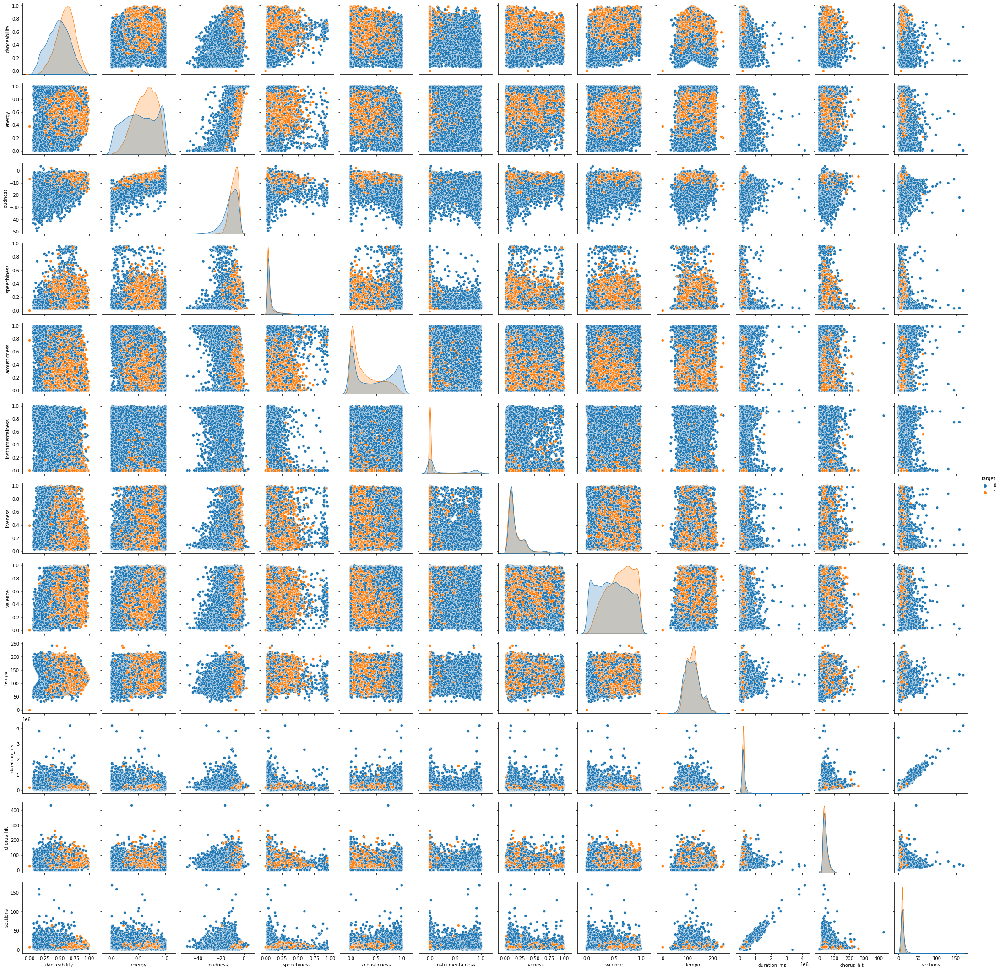

In [13]:
sns.pairplot(df[regression_columns + ['target']], hue='target')

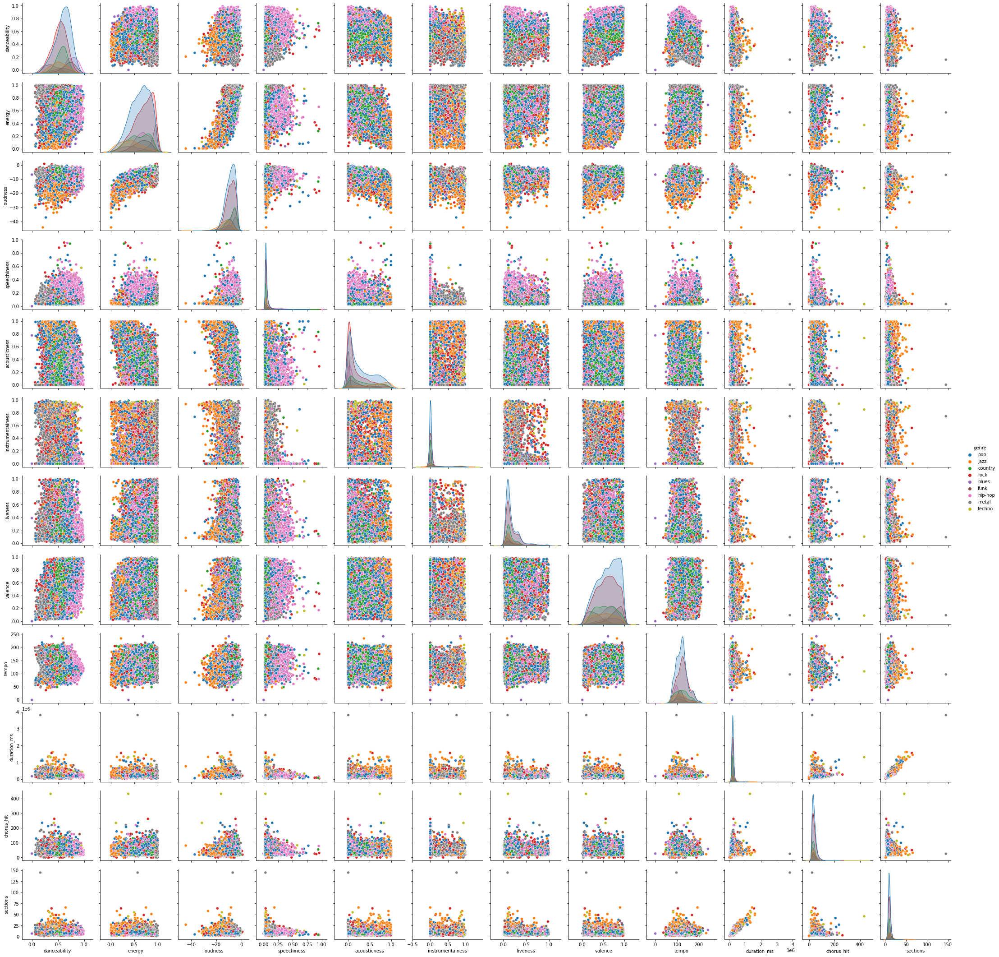

In [14]:
sns.pairplot(df[regression_columns + ['genre']], hue='genre')

## Correlation heatmap

In [15]:
cormat=df.corr()
round(cormat, 2)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade
danceability,1.00,0.21,0.02,0.27,-0.03,0.16,-0.26,-0.30,-0.12,0.55,-0.07,-0.06,0.19,-0.04,-0.06,0.35,-0.01
energy,0.21,1.00,0.02,0.77,-0.03,0.12,-0.72,-0.21,0.16,0.34,0.22,0.01,0.20,0.01,-0.04,0.18,-0.19
key,0.02,0.02,1.00,0.01,-0.14,0.03,-0.02,-0.01,0.00,0.01,0.00,0.02,0.00,0.01,0.01,0.01,-0.01
loudness,0.27,0.77,0.01,1.00,0.00,0.07,-0.57,-0.37,0.09,0.27,0.17,-0.05,0.17,-0.01,-0.08,0.29,-0.29
mode,-0.03,-0.03,-0.14,0.00,1.00,-0.06,0.05,-0.08,0.01,0.04,0.03,-0.07,-0.01,-0.02,-0.06,0.08,0.05
speechiness,0.16,0.12,0.03,0.07,-0.06,1.00,-0.08,-0.08,0.13,0.00,0.04,0.01,0.02,0.01,-0.01,-0.04,-0.15
acousticness,-0.26,-0.72,-0.02,-0.57,0.05,-0.08,1.00,0.20,-0.03,-0.20,-0.18,-0.07,-0.19,-0.01,-0.02,-0.25,0.18
instrumentalness,-0.30,-0.21,-0.01,-0.37,-0.08,-0.08,0.20,1.00,-0.05,-0.29,-0.05,0.11,-0.08,0.05,0.08,-0.41,-0.01
liveness,-0.12,0.16,0.00,0.09,0.01,0.13,-0.03,-0.05,1.00,0.00,0.02,0.01,0.00,0.04,-0.01,-0.05,0.01
valence,0.55,0.34,0.01,0.27,0.04,0.00,-0.20,-0.29,0.00,1.00,0.11,-0.17,0.16,-0.06,-0.13,0.25,0.17


<AxesSubplot:>

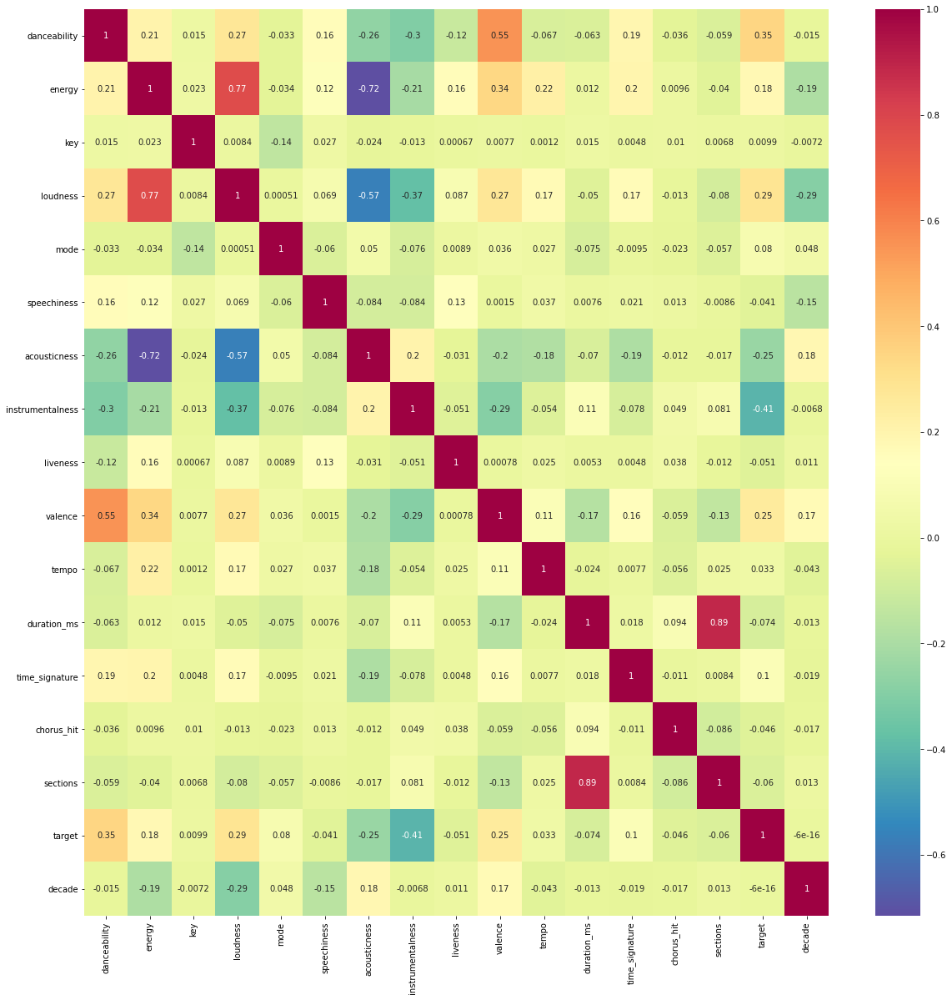

In [16]:
fig,ax=plt.subplots(figsize=(20,20))
sns.heatmap(cormat, cmap="Spectral_r", annot=True, ax=ax)

## Dimension reduction

In [17]:
pca = PCA(2)
x_pca = pca.fit_transform(df[['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'liveness', 'valence', 'tempo', 'duration_ms', 'chorus_hit', 'sections']])

In [18]:
x_pca

array([[-6.13445510e+04,  6.62544404e+01],
       [-2.12645502e+04, -1.82400185e+01],
       [-1.09175504e+04, -3.37453339e+00],
       ...,
       [-7.11755088e+03,  1.93840170e+00],
       [-2.14905506e+04,  1.51382776e+00],
       [ 1.06518450e+05, -2.56446738e+01]])

<AxesSubplot:>

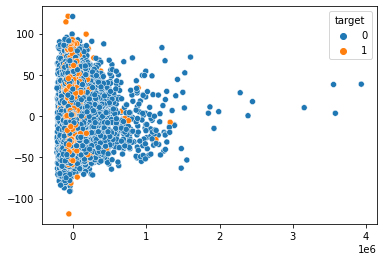

In [19]:
sns.scatterplot(x=x_pca[:,0], y=x_pca[:,1], hue=df['target'])

<AxesSubplot:>

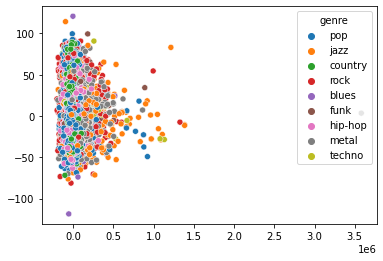

In [20]:
sns.scatterplot(x=x_pca[:,0], y=x_pca[:,1], hue=df['genre'])

## Outliers

### Using Z-score

In [21]:
z_instrumentalness = np.abs(stats.zscore(df['instrumentalness']))
z_loudness = np.abs(stats.zscore(df['loudness']))
print(z_instrumentalness)
print(z_loudness)

[0.50874028 0.15621739 0.50872572 ... 0.50873033 2.35097812 1.78430581]
[0.46964069 0.42425845 0.59690072 ... 1.06193359 1.10108394 2.4104918 ]


Total: 41106, Outliers: 982, Percentage outliers: 2.39%


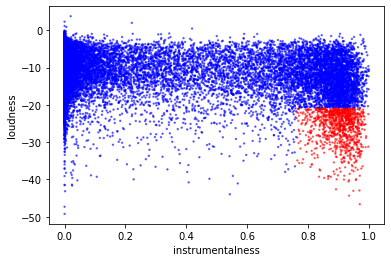

In [22]:
threshold = 2
outlier = np.logical_and(np.abs(z_instrumentalness) > threshold, np.abs(z_loudness) > threshold)
colors = list(map(lambda x: 'red' if x else 'blue', outlier))
df.plot.scatter(x="instrumentalness",y="loudness", c=colors, alpha=0.5, s=2)
print(f'Total: {len(outlier)}, Outliers: {sum(outlier)}, Percentage outliers: {sum(outlier) / len(outlier) * 100:.2f}%')

### Using IQR

In [23]:
Q1=df.quantile(0.25)
Q3=df.quantile(0.75)
IQR=Q3-Q1
print(IQR)

danceability            0.249000
energy                  0.391000
key                     6.000000
loudness                6.441750
mode                    1.000000
speechiness             0.036100
acousticness            0.636600
instrumentalness        0.061250
liveness                0.167000
valence                 0.438000
tempo                  39.097000
duration_ms         93845.250000
time_signature          0.000000
chorus_hit             20.025822
sections                4.000000
target                  1.000000
decade                 70.000000
dtype: float64


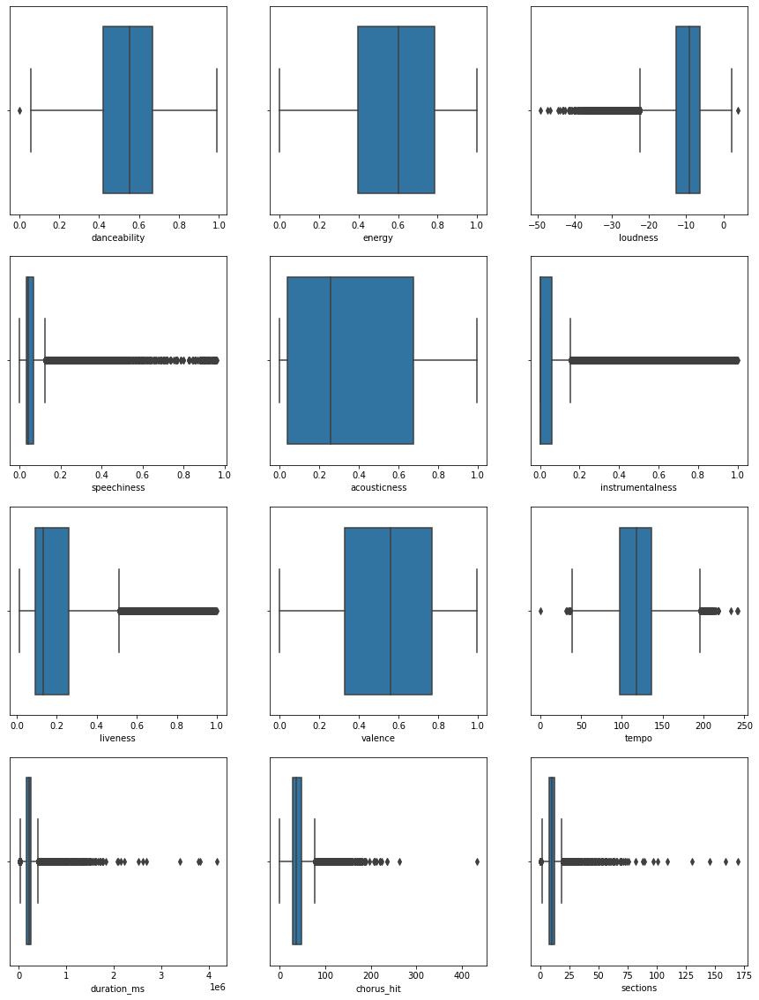

In [24]:
fig, axes = plt.subplots(4, math.ceil(len(regression_columns) / 4), figsize=(15, 20))
for i, col in enumerate(regression_columns):
    ax = sns.boxplot(x=df[col], ax=axes.flatten()[i])

In [25]:
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outlier_table = (df < lower_bound) | (df > upper_bound)

Let's take out songs that are outliers both in instrumentalness AND loudness

Total: 41106, Outliers: 984, Percentage outliers: 2.39%


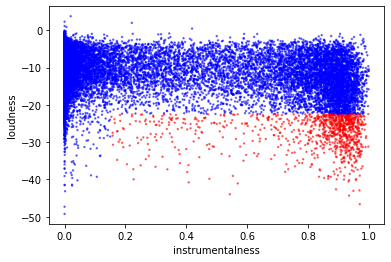

In [26]:
outlier = outlier_table['instrumentalness'] & outlier_table['loudness']
colors = outlier.map({True: 'red', False: 'blue'})
df.plot.scatter(x='instrumentalness',y='loudness', c=colors, alpha=0.5, s=2)
print(f'Total: {len(outlier)}, Outliers: {sum(outlier)}, Percentage outliers: {sum(outlier) / len(outlier) * 100:.2f}%')